<a href="https://colab.research.google.com/github/69Rajeev69/1BM21AI100/blob/main/Galleri5_Image_Generation_(Master).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install replicate
!pip install runpod


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.7/42.7 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 930.2 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.2/92.2 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.9/225.9 kB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.7/67.7 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.0/83.0 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
#@title Helper Functions

REPLIT = 'r8_c6O2JKAav0bmGtCEpTidhQScTMBgNTA4UXE6s'
RUNPOD = 'O9C7HFSQHFUHI6LJ5VB6V4BNLU7EOFU92ERQCGIM'

import replicate
import base64
from PIL import Image
import io
import requests
import random
from IPython.display import display, HTML
from io import BytesIO
import os
import runpod
import time



def display_base64_image(base64_string):
    html = f'<img src="data:image/png;base64,{base64_string}" />'
    display(HTML(html))




def save_base64_as_image(base64_string, image_file_path):
    image_data = base64.b64decode(base64_string)
    image = Image.open(BytesIO(image_data))
    image.save(image_file_path)



# Function to convert base64 string to grayscale base64 string
def convert_to_grayscale(base64_image):
    # Decode base64 string to image data
    image_data = base64.b64decode(base64_image)

    # Convert image data to PIL image
    pil_image = Image.open(io.BytesIO(image_data))

    # Convert PIL image to grayscale
    grayscale_image = pil_image.convert('L')

    # Convert grayscale image to base64 string
    buffered = io.BytesIO()
    grayscale_image.save(buffered, format="PNG")
    grayscale_base64 = base64.b64encode(buffered.getvalue()).decode("utf-8")

    return grayscale_base64


def local2b64(path):
    with open(path, "rb") as image_file:
        image_data = image_file.read()
        b64_encoded = base64.b64encode(image_data).decode("utf-8")
        return b64_encoded


def getHQmask(url, text):
    headers = {
        'x-api-key': 'fake-duper-secret-key-6969',
        'Content-Type': 'application/json'
    }
    response = requests.post('https://cuda.indianetailer.in/hqsam/', headers=headers, json={
        'image': local2b64(url),
        'text': text,

    }).json()

    return convert_to_grayscale(response[1])


def url2base64(url):
    response = requests.get(url)
    response.raise_for_status()  # Ensure the request was successful
    image_data = response.content
    base64_string = base64.b64encode(image_data).decode('utf-8')
    return base64_string


def randStr(n):
    import string
    import random
    return ''.join(random.choices(string.ascii_lowercase + string.digits, k=n))



def runpodInit(mode):
    if mode == 'sdxl':
        runpod.api_key = RUNPOD
        endpoint = runpod.Endpoint("j0p43fbodosuiq")
        return endpoint



def run(args):
    pod = runpodInit(args.get('model'))
    payload = args.get('payload')
    output = pod.run(payload)
    gen = False
    while not gen:
        out = output.output()
        jobId = output.job_id
        print(output.status())
        if output.status() == 'FAILED':
            gen = True
            return output
        try:
            output = out['images']
            gen = True
            return output
        except:
            time.sleep(5)
    return "Success"

os.makedirs('/content/poseImages',exist_ok=True)


In [ ]:
def generate_prompt(clothing, location, theme, ethnicity, skin_color, hair_length, hair_color, hair_type, body_type, shot_type, pose):
    prompt = (
        f"A person of {ethnicity} ethnicity with {skin_color} skin stands in a minimalistic {location} setting. "
        f"The background includes only a single feature representative of the {location}, creating a subtle {theme} atmosphere. "
        f"The person is dressed in {clothing}, with {hair_length} {hair_type} {hair_color} hair. They have a {body_type} body type and are posing {pose}. "
        f"The shot type is {shot_type}, capturing their bright, expressive eyes looking directly at the camera, exuding a sense of personality fitting the scene. "
        f"The focus is entirely on the person, with minimal distractions from the {location}, ensuring a {theme} aesthetic."
    )
    return prompt

# Example usage
clothing = "a sleek black t-shirt with a futuristic graphic, dark jeans, and stylish sneakers"
location = "cyberpunk cityscape"
theme = "cinematic and minimalistic"
ethnicity = "Asian"
skin_color = "fair"
hair_length = "short"
hair_color = "blue"
hair_type = "spiky"
body_type = "athletic"
shot_type = "medium length"
pose = "standing with hands on hips, looking determined"

pro = generate_prompt(clothing, location, theme, ethnicity, skin_color, hair_length, hair_color, hair_type, body_type, shot_type, pose)
print(pro)

In [ ]:
repl = replicate.Client(api_token=REPLIT)
output = repl.run(
    "fofr/sd3-explorer:7c48d3a1f9e16683c3f1e546056becfe31b963a872384458703f7aa6a40a2c69",
    input={
        "model": "sd3_medium_incl_clips_t5xxlfp16.safetensors",
        "shift": 3,
        "steps": 28,
        "width": 960,
        "height": 1280,
        "prompt": pro,
        "sampler": "dpmpp_2m",
        "scheduler": "sgm_uniform",
        "output_format": "webp",
        "guidance_scale": 4.5,
        "output_quality": 100,
        "negative_prompt": "",
        "number_of_images": 4,
        "triple_prompt_t5": "",
        "use_triple_prompt": False,
        "triple_prompt_clip_g": "",
        "triple_prompt_clip_l": "",
        "negative_conditioning_end": 0,
        "triple_prompt_empty_padding": True
    }
)

print(output)

In [ ]:
from requests import Session
sez = Session()
def u2netsegment(image):

    res = sez.post("https://cuda2.indianetailer.in/u2net-segment", json={"b64":image}).json()
    return res

In [ ]:
maskList = u2netsegment(local2b64('/content/ComfyUI_temp_mfppe_00002_.png'))

In [ ]:
mask = maskList['class_3']


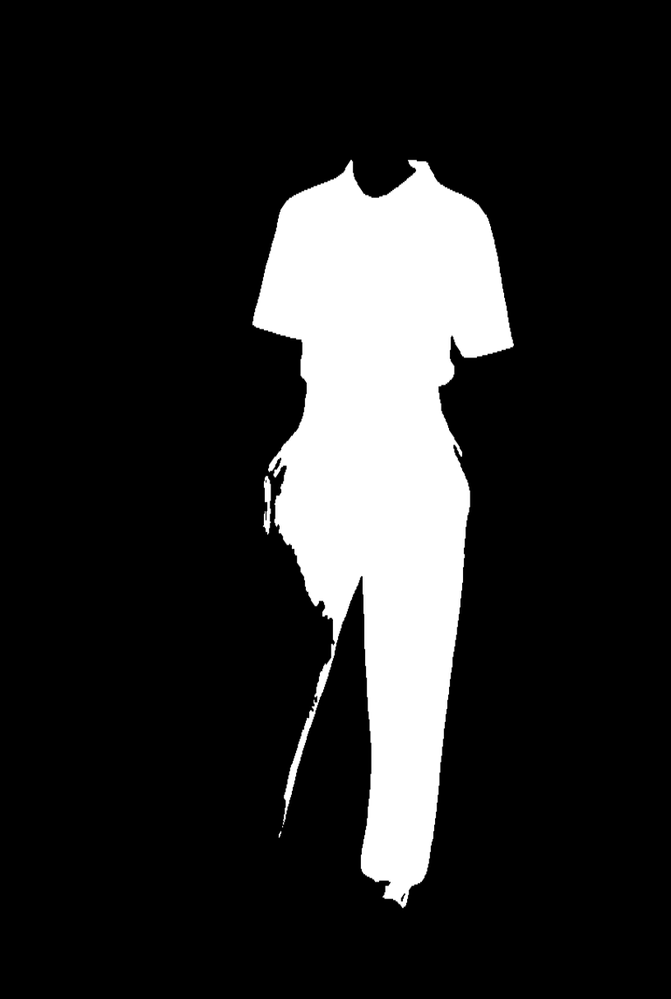

In [ ]:
display_base64_image(mask)


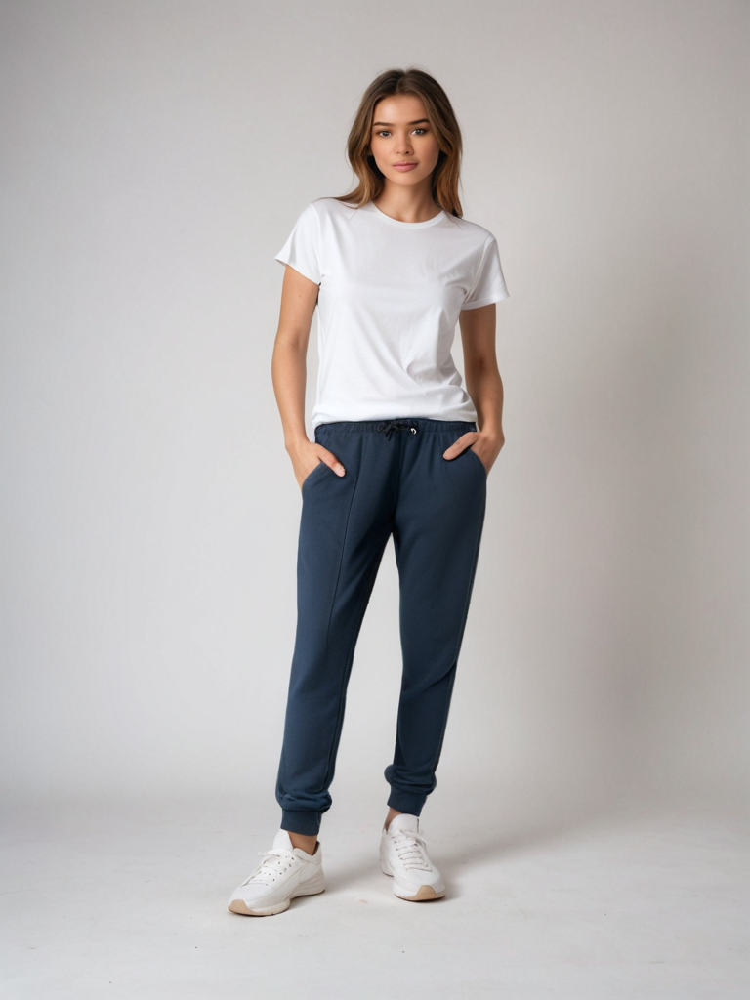

output/iuula2s1_swap.jpeg



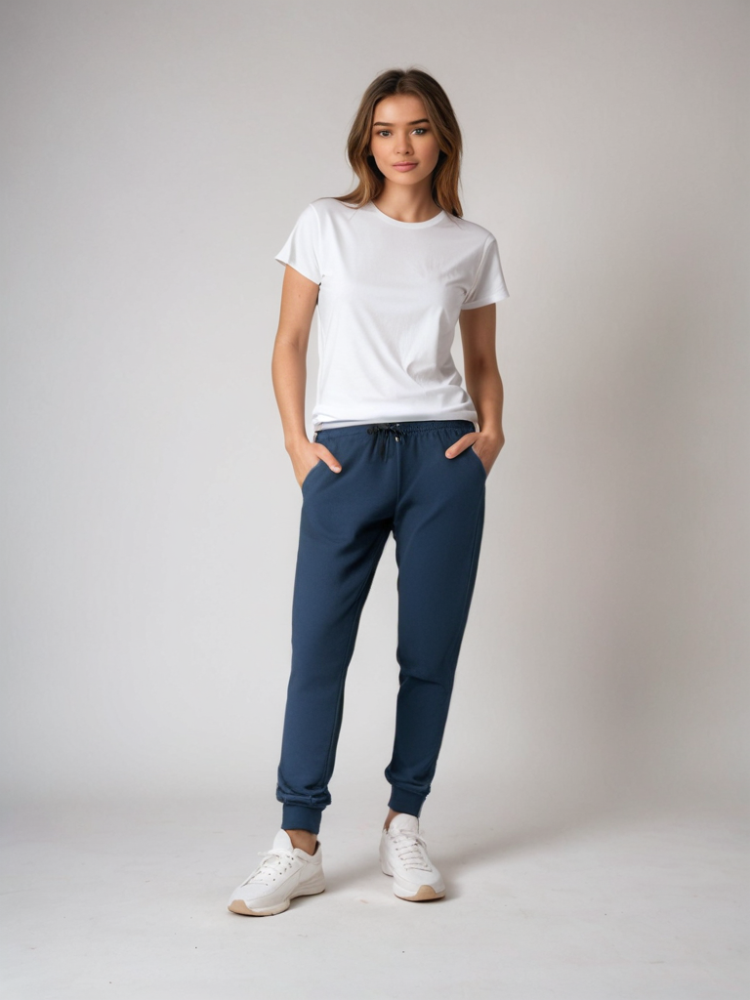

output/y8z1t3ld_swap.jpeg



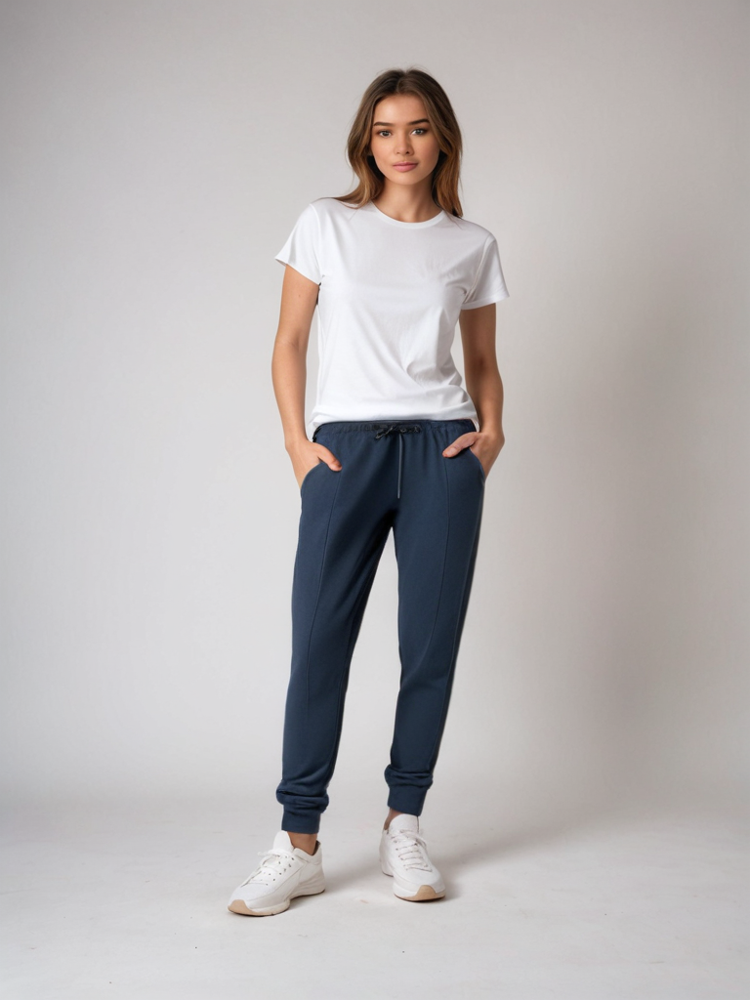

output/9z1qy0l7_swap.jpeg



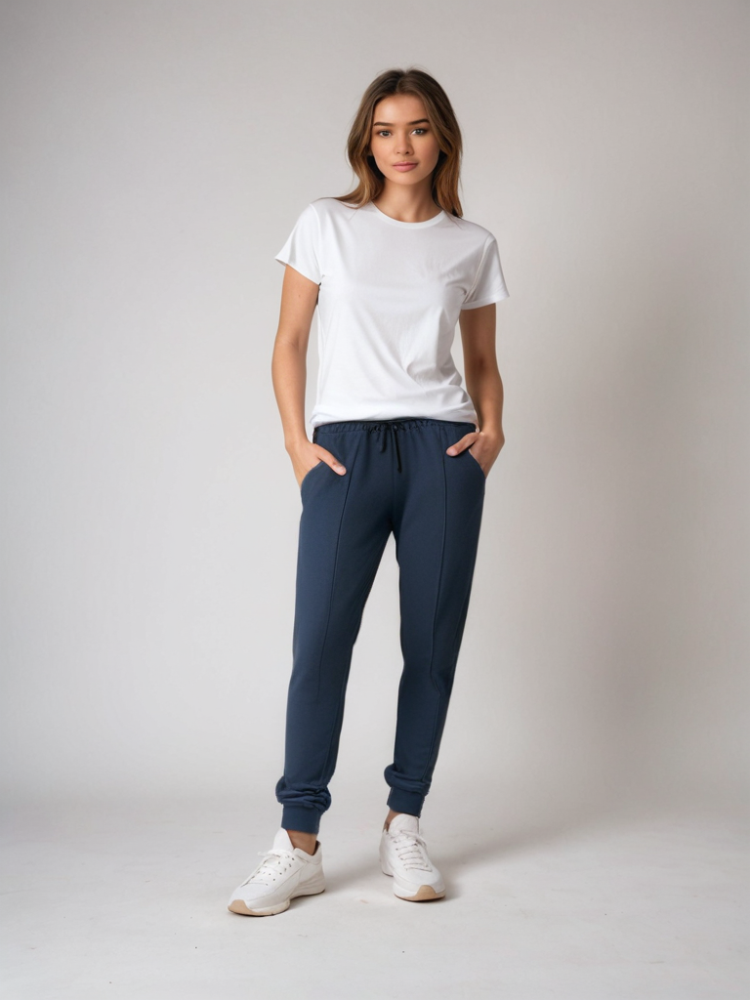

output/pjje19s8_swap.jpeg



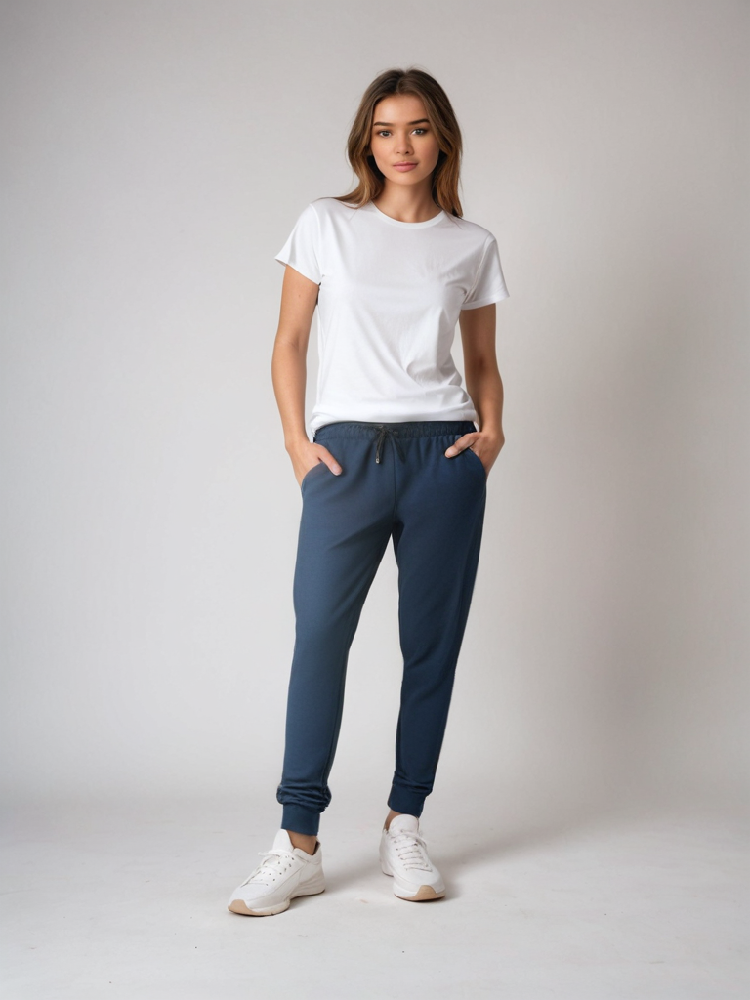

output/f8dy2dc8_swap.jpeg



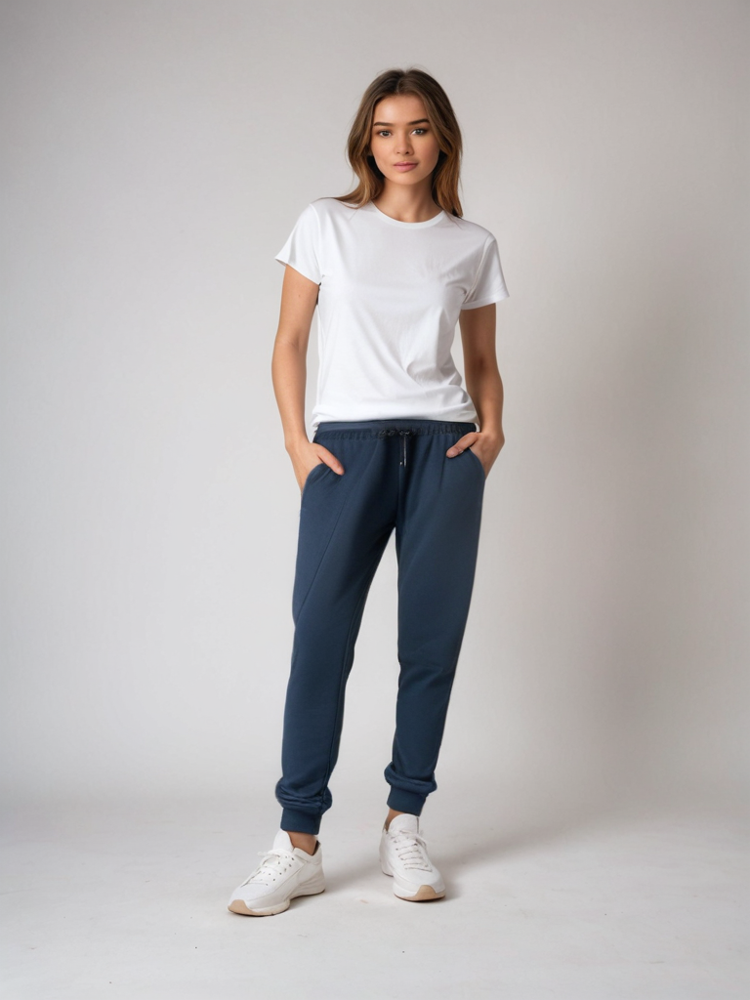

output/q15g2qf1_swap.jpeg



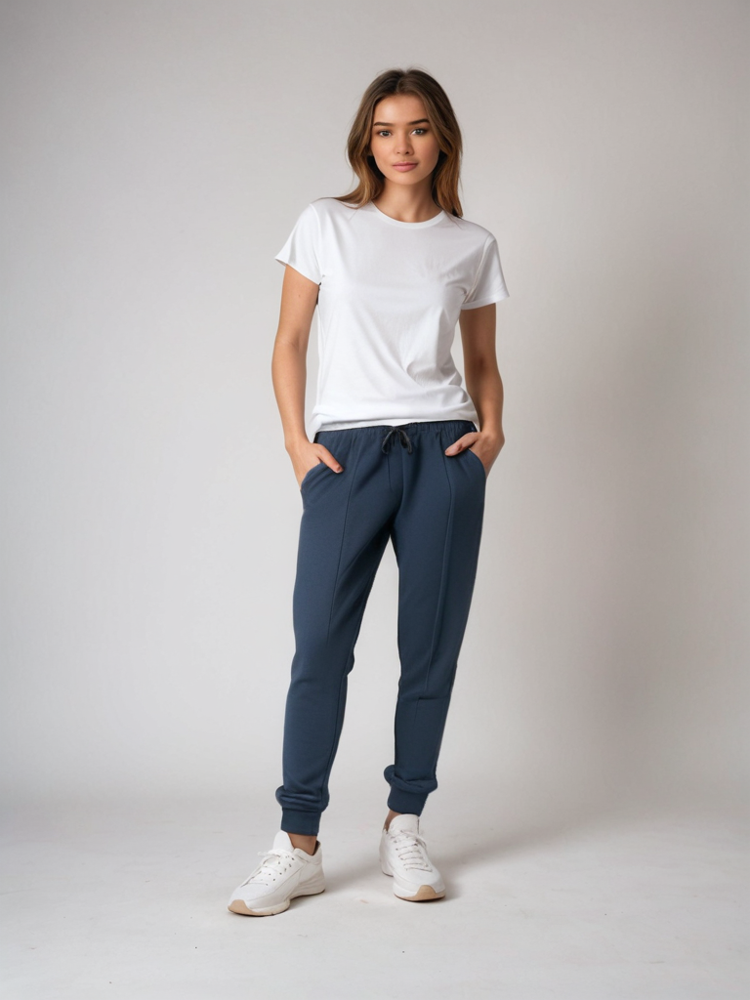

output/ohvkh49d_swap.jpeg



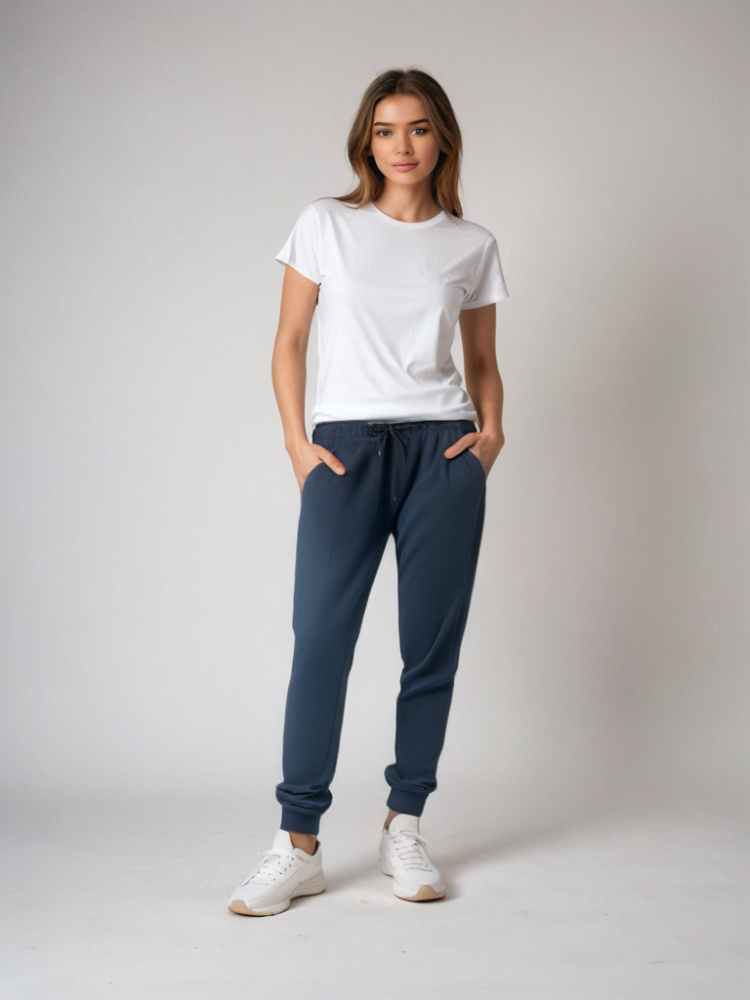

output/zi4jurea_swap.jpeg



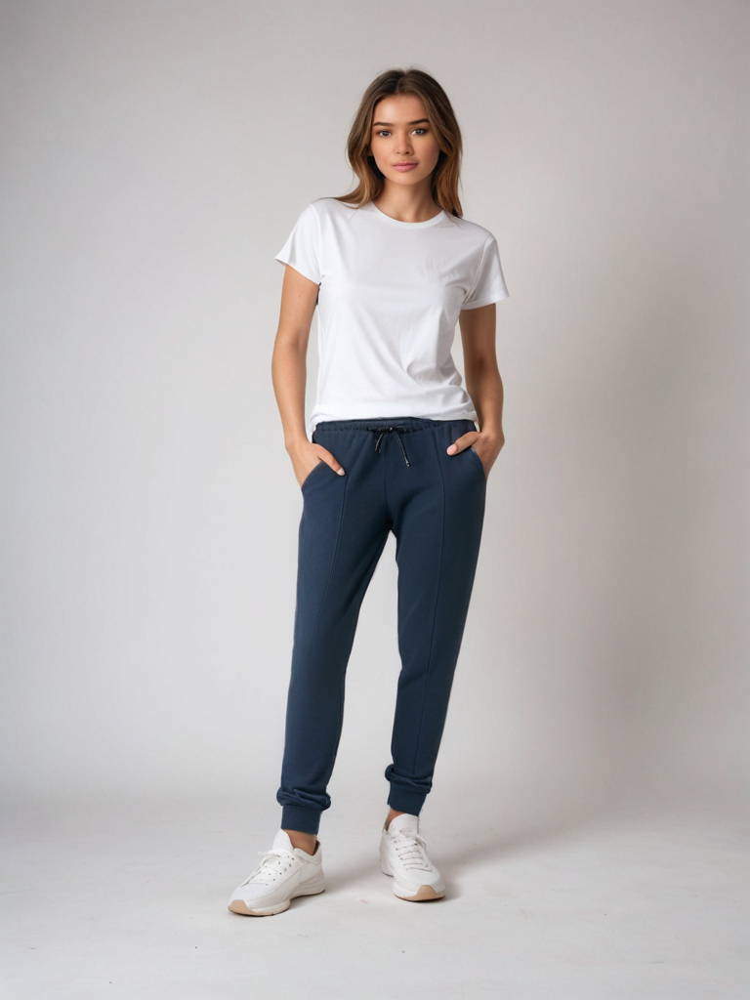

output/dvzda4v9_swap.jpeg



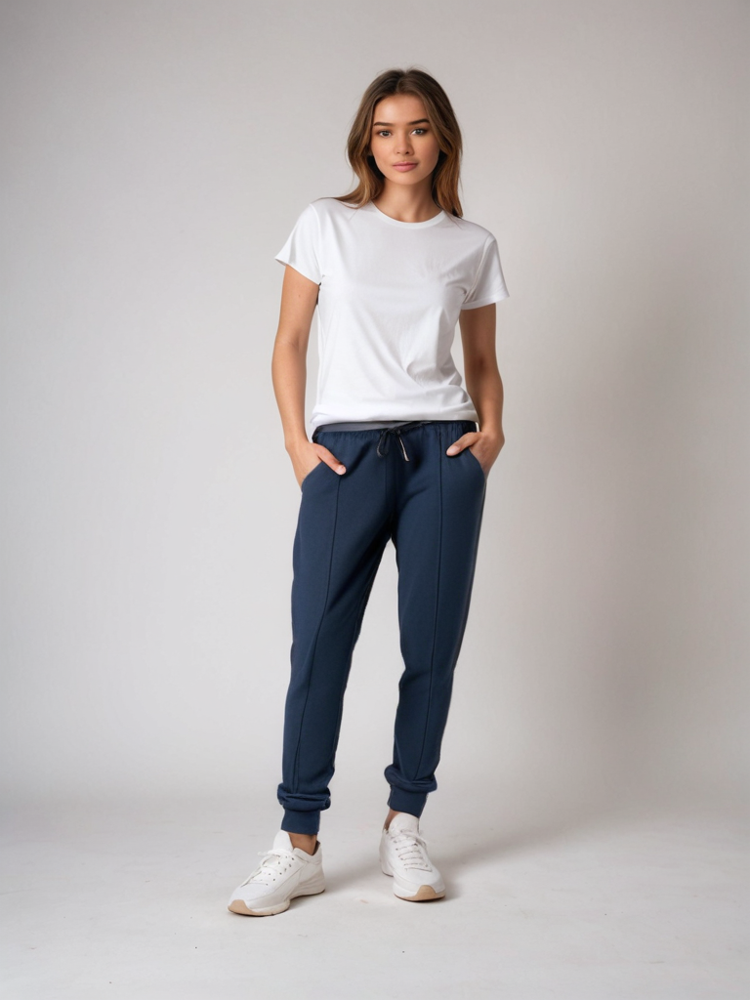

output/l8woup7o_swap.jpeg


In [ ]:
#@title Clothing Swap
import requests
personImagesForSwap = ['/content/poseImages/ComfyUI_temp_houvl_00003_.png']
GarmentImage = '/content/poseImages/d3pakhosla (51).jpeg'
article = 'pant'
outs = 'output'
os.makedirs(outs,exist_ok=True)
for i in range(10):
  for personUrl in personImagesForSwap:
      # mask = getHQmask(personUrl ,article)

      headers = {
          'x-api-key': 'fake-duper-secret-key-6969',
          'Content-Type': 'application/json'
      }
      response = requests.post('https://cuda.indianetailer.in/1VTONtorulethemall/', headers=headers, json={
          'person': local2b64(personUrl),
          'garment':local2b64(GarmentImage),
          'mask': local2b64('/content/poseImages/temp_ryepe_00001_.png'),
          'garmentDesc':'Dark Blue Slim Fit Cotton Joggers'}).json()

      output = response['output']['output']
      display_base64_image(output)
      path = f'{outs}/{randStr(8)}_swap.jpeg'
      save_base64_as_image(output, path)
      print(path)


In [ ]:
response.content

AttributeError: 'dict' object has no attribute 'content'

In [ ]:
import requests
personImagesForSwap = ['/content/poseImages/front.png']
GarmentImage = '/content/poseImages/d3pakhosla (44).jpg'
article = 'pant'
outs = 'output'
os.makedirs(outs,exist_ok=True)

In [ ]:
headers = {
    'x-api-key': 'fake-duper-secret-key-6969',
    'Content-Type': 'application/json'
}
response = requests.post('https://cuda.indianetailer.in/1VTONtorulethemall/', headers=headers, json={
    'person': local2b64(personUrl),
    'garment':local2b64(GarmentImage),
    'mask': local2b64('/content/poseImages/temp_xubhc_00001_.png'),
    'garmentDesc':'Navy Blue Cotton Joggers'}).json()

In [ ]:
#@title Upscale

ImageUrl = ''

output = repl.run(
    "philz1337x/clarity-upscaler:dfad41707589d68ecdccd1dfa600d55a208f9310748e44bfe35b4a6291453d5e",
    input = {
            "image": ImageUrl,
            "prompt": "man, masterpiece, best quality, highres, <lora:more_details:0.5> <lora:SDXLrender_v2.0:1>",
            "negative_prompt": "feminine, (worst quality, low quality, normal quality:2) JuggernautNegative-neg",
            "resemblance": 1.6
        }
)
print(output)

In [ ]:
#@title Generate with Pose


promptPrefix = 'A full length view shot of'
prompt = 'a slim whitish male model,  wearing a (untucked grey t-shirt),Navy blue underwear, Black sneakers, studio lighting, model shadows, at the bright grey backdrop.'
cfg = 7
width = 832
height = 1216
model = 'realvis4xl'
posePath = '/content/bewa1.jpg'

args = {
'model': 'sdxl',
'payload': {
    "input": {
        "api": {
            "method": "POST",
            "endpoint": "/sdapi/v1/txt2img"
        },
        "payload": {
            "prompt": promptPrefix + prompt, #f"Raw Photo, Lebanese woman {posePrompt}, at {background} ,wearing a {clothingKeyword} <lora:{clothingLora}:1> {sdescription}",
            "negative_prompt": "bad eyes, bad fingers, cgi, plastic face, bad anatomy, body horror, improper body ratio, bad face, blur face.",
            "seed": -1,
            "batch_size": 4,
            "steps": 25,
            "cfg_scale": cfg,
            "width": width,
            "height": height,
            "sampler_name": "DPM++ 2M",
            "sampler_index": "DPM++ 2M",
            "restore_faces": True,
            "override_settings": {
                "sd_model_checkpoint": model,
            },
            "override_settings_restore_afterwards": False,
            "alwayson_scripts": {
                "controlnet": {
                    "args": [
                            {
                            "input_image": local2b64(posePath),
                            "model": "openposenew [d0333a45]",
                            "module": "openpose_hand",
                            "mask": None,
                            "pixel_perfect": True,
                            # "processor_res": 768,
                            "pulid_mode": "Fidelity",
                            "resize_mode": "Just Resize",
                            "save_detected_map": True,
                            "threshold_a": 0.5,
                            "threshold_b": 0.5,
                            "weight": 0.8,
                            "enabled": True,
                            "guidance_end": 1.0,
                            "guidance_start": 0.0,
                            "control_mode": "Balanced",
                            "effective_region_mask": None,

                            }
                            ]
                }
            }
        }
    }
},
}


In [ ]:
out = run(args)

IN_PROGRESS
IN_PROGRESS
IN_PROGRESS
IN_PROGRESS
COMPLETED



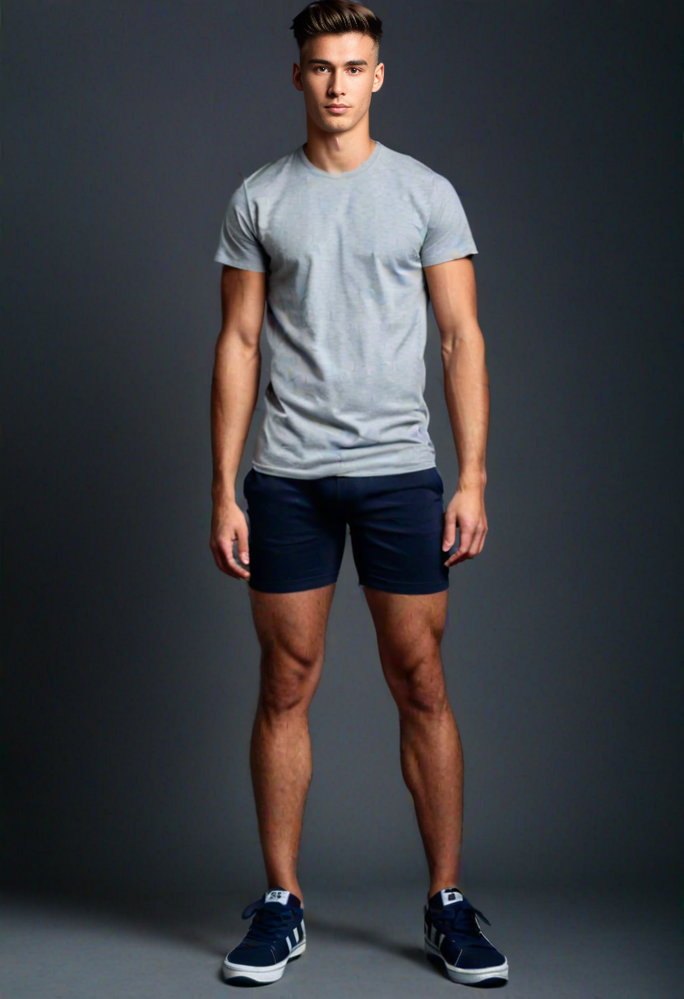

In [ ]:
display_base64_image(out[1])

In [ ]:
display_base64_image(out[1])